In [3]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/oil-storage-tanks/Oil Tanks/labels.json
/kaggle/input/oil-storage-tanks/Oil Tanks/labels_coco.json
/kaggle/input/oil-storage-tanks/Oil Tanks/large_image_data.csv
/kaggle/input/oil-storage-tanks/Oil Tanks/large_images/76_large.jpg
/kaggle/input/oil-storage-tanks/Oil Tanks/large_images/23_large.jpg
/kaggle/input/oil-storage-tanks/Oil Tanks/large_images/06_large.jpg
/kaggle/input/oil-storage-tanks/Oil Tanks/large_images/100_large.jpg
/kaggle/input/oil-storage-tanks/Oil Tanks/large_images/78_large.jpg
/kaggle/input/oil-storage-tanks/Oil Tanks/large_images/62_large.jpg
/kaggle/input/oil-storage-tanks/Oil Tanks/large_images/79_large.jpg
/kaggle/input/oil-storage-tanks/Oil Tanks/large_images/09_large.jpg
/kaggle/input/oil-storage-tanks/Oil Tanks/large_images/53_large.jpg
/kaggle/input/oil-storage-tanks/Oil Tanks/large_images/73_large.jpg
/kaggle/input/oil-storage-tanks/Oil Tanks/large_images/48_large.jpg
/kaggle/input/oil-storage-tanks/Oil Tanks/large_images/97_large.jpg
/kaggle

In [4]:
!pip install -q ultralytics


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 18.4 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.9 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 79.0 MB/s eta 0:00:00:00:010:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 75.9 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 41.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.5 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 7.9 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 30.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 13.4 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 3.8 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 81.0 MB/s eta 0:00:00:00:0100:01


In [5]:

import os
import json
import pandas as pd




In [6]:
patch_path = "/kaggle/input/oil-storage-tanks/Oil Tanks/image_patches"
os.listdir(patch_path)[:5]


['17_6_3.jpg', '15_8_1.jpg', '33_6_0.jpg', '03_8_1.jpg', '08_9_1.jpg']

In [7]:
import cv2
img = cv2.imread(os.path.join(patch_path, os.listdir(patch_path)[0]))
print(img.shape)  # Should be (512, 512, 3)


(512, 512, 3)


In [8]:
large_path = "/kaggle/input/oil-storage-tanks/Oil Tanks/large_images"
os.listdir(large_path)


['76_large.jpg',
 '23_large.jpg',
 '06_large.jpg',
 '100_large.jpg',
 '78_large.jpg',
 '62_large.jpg',
 '79_large.jpg',
 '09_large.jpg',
 '53_large.jpg',
 '73_large.jpg',
 '48_large.jpg',
 '97_large.jpg',
 '18_large.jpg',
 '64_large.jpg',
 '87_large.jpg',
 '21_large.jpg',
 '47_large.jpg',
 '75_large.jpg',
 '80_large.jpg',
 '13_large.jpg',
 '50_large.jpg',
 '67_large.jpg',
 '10_large.jpg',
 '29_large.jpg',
 '05_large.jpg',
 '27_large.jpg',
 '58_large.jpg',
 '92_large.jpg',
 '63_large.jpg',
 '77_large.jpg',
 '11_large.jpg',
 '88_large.jpg',
 '38_large.jpg',
 '39_large.jpg',
 '81_large.jpg',
 '19_large.jpg',
 '20_large.jpg',
 '51_large.jpg',
 '90_large.jpg',
 '69_large.jpg',
 '56_large.jpg',
 '34_large.jpg',
 '44_large.jpg',
 '25_large.jpg',
 '07_large.jpg',
 '71_large.jpg',
 '14_large.jpg',
 '08_large.jpg',
 '72_large.jpg',
 '61_large.jpg',
 '94_large.jpg',
 '95_large.jpg',
 '85_large.jpg',
 '98_large.jpg',
 '41_large.jpg',
 '74_large.jpg',
 '35_large.jpg',
 '84_large.jpg',
 '59_large.jp

In [9]:
img = cv2.imread(os.path.join(large_path, "06_large.jpg"))
print(img.shape)  # Expect (4800, 4800, 3)


(4800, 4800, 3)


In [10]:
import json
with open("/kaggle/input/oil-storage-tanks/Oil Tanks/labels.json", "r") as f:
    custom_labels = json.load(f)
custom_labels = list(custom_labels)
print(len(custom_labels))
# print(custom_labels)


10000


In [11]:
with open("/kaggle/input/oil-storage-tanks/Oil Tanks/labels_coco.json", "r") as f:
    coco = json.load(f)

print("Images:", len(coco['images']))
print("Annotations:", len(coco['annotations']))
print("Categories:", coco['categories'])


Images: 10000
Annotations: 5820
Categories: [{'id': 1, 'name': 'Floating Head Tank'}]


In [12]:
import pandas as pd
df = pd.read_csv("/kaggle/input/oil-storage-tanks/Oil Tanks/large_image_data.csv")
df.head()


,Filename,Eye Alt (m),Latitude,Longitude,General Location
0,01_large.jpg,3000,"29°22'16.84""N","94°55'46.18""W","Texas City, Texas, United States"
1,02_large.jpg,3000,"29°22'17.46""N","94°53'59.82""W","Texas City, Texas, United States"
2,03_large.jpg,3000,"28°56'42.65""N","95°19'34.26""W","Brazosport, Texas, United States"
3,04_large.jpg,3000,"28°59'43.65""N","95°23'50.35""W","Clute, Texas, United States"
4,05_large.jpg,3000,"29°43'7.97""N","95°14'54.80""W","Houston, Texas, United States"


In [13]:
# Get all annotated image filenames
available_files = [img['file_name'] for img in coco['images']]
print(f"Total annotated images: {len(available_files)}")
print("First 5 available images:", available_files[:5])


Total annotated images: 10000
First 5 available images: ['01_0_0.jpg', '01_0_1.jpg', '01_0_2.jpg', '01_0_3.jpg', '01_0_4.jpg']


In [14]:
import os
import cv2
import json
import matplotlib.pyplot as plt

# Set paths
PATCH_DIR = "/kaggle/input/oil-storage-tanks/Oil Tanks/image_patches"
LABELS_PATH = "/kaggle/input/oil-storage-tanks/Oil Tanks/labels_coco.json"

# Load COCO annotations
with open(LABELS_PATH, "r") as f:
    coco = json.load(f)


In [15]:
target_filename = "01_0_0.jpg"

# Get the image ID
image_entry = next(img for img in coco['images'] if img['file_name'] == target_filename)
image_id = image_entry['id']

# Load the image
img_path = os.path.join(PATCH_DIR, target_filename)
img = cv2.imread(img_path)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)


In [16]:
# Get all annotations for this image
annotations = [ann for ann in coco['annotations'] if ann['image_id'] == image_id]

print(f"Found {len(annotations)} tanks in {target_filename}")

# Crop each bounding box
cropped_tanks = []
for ann in annotations:
    x, y, w, h = list(map(int, ann['bbox']))
    crop = img_rgb[y:y+h, x:x+w]
    cropped_tanks.append(crop)


Found 0 tanks in 01_0_0.jpg


In [17]:
import json

# Load the custom labels
custom_label_path = "/kaggle/input/oil-storage-tanks/Oil Tanks/labels.json"
with open(custom_label_path, "r") as f:
    custom_labels = json.load(f)

# Print number of entries and show first 5
print(f"Total entries: {len(custom_labels)}")
custom_labels[:5]


Total entries: 10000


[{'id': 0, 'file_name': '01_0_0.jpg', 'label': 'Skip'},
 {'id': 1, 'file_name': '01_0_1.jpg', 'label': 'Skip'},
 {'id': 2, 'file_name': '01_0_2.jpg', 'label': 'Skip'},
 {'id': 3, 'file_name': '01_0_3.jpg', 'label': 'Skip'},
 {'id': 4,
  'file_name': '01_0_4.jpg',
  'label': {'Tank': [{'geometry': [{'x': 438, 'y': 254},
      {'x': 438, 'y': 271},
      {'x': 455, 'y': 271},
      {'x': 455, 'y': 254}]},
    {'geometry': [{'x': 388, 'y': 259},
      {'x': 388, 'y': 279},
      {'x': 408, 'y': 279},
      {'x': 408, 'y': 259}]}]}}]

In [18]:
import json

COCO_PATH = "/kaggle/input/oil-storage-tanks/Oil Tanks/labels_coco.json"
with open(COCO_PATH, "r") as f:
    coco = json.load(f)

# Show 2 examples
print(coco["images"][:2])
# print(coco["annotations"][:2])
print(len(coco))
# print(coco)


[{'id': 0, 'file_name': '01_0_0.jpg'}, {'id': 1, 'file_name': '01_0_1.jpg'}]
3


In [19]:
import json
import pandas as pd
from collections import defaultdict

# Load files
with open("/kaggle/input/oil-storage-tanks/Oil Tanks/labels.json", "r") as f:
    labels = json.load(f)

with open("/kaggle/input/oil-storage-tanks/Oil Tanks/labels_coco.json", "r") as f:
    coco = json.load(f)

# COCO mappings
id_to_file = {img["id"]: img["file_name"] for img in coco["images"]}
file_to_id = {v: k for k, v in id_to_file.items()}

# group all bbox entries by file
bbox_map = defaultdict(list)
for ann in coco["annotations"]:
    img_id = ann["image_id"]
    file_name = id_to_file[img_id]
    bbox_map[file_name].append(ann["bbox"])

# Collect everything into rows
rows = []

for entry in labels:
    file = entry["file_name"]
    image_id = file_to_id.get(file)
    label = entry["label"]

    if label == "Skip":
        rows.append({
            "file_name": file,
            "image_id": image_id,
            "status": "Skip",
            "tank_index": None,
            "geometry": None,
            "bbox_x": None,
            "bbox_y": None,
            "bbox_w": None,
            "bbox_h": None
        })
    else:
        tank_list = label.get("Tank", [])
        bbox_list = bbox_map.get(file, [])
        
        for i, tank in enumerate(tank_list):
            bbox = bbox_list[i] if i < len(bbox_list) else [None]*4
            rows.append({
                "file_name": file,
                "image_id": image_id,
                "status": "Tank",
                "tank_index": i,
                "geometry": tank["geometry"],
                "bbox_x": bbox[0],
                "bbox_y": bbox[1],
                "bbox_w": bbox[2],
                "bbox_h": bbox[3]
            })

# Build DataFrame
df_all = pd.DataFrame(rows)
df_all.head()


/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()


,file_name,image_id,status,tank_index,geometry,bbox_x,bbox_y,bbox_w,bbox_h
0,01_0_0.jpg,0,Skip,NaN,None,NaN,NaN,NaN,NaN
1,01_0_1.jpg,1,Skip,NaN,None,NaN,NaN,NaN,NaN
2,01_0_2.jpg,2,Skip,NaN,None,NaN,NaN,NaN,NaN
3,01_0_3.jpg,3,Skip,NaN,None,NaN,NaN,NaN,NaN
4,01_0_4.jpg,4,Tank,0.0,"[{'x': 438, 'y': 254}, {'x': 438, 'y': 271}, {...",NaN,NaN,NaN,NaN


In [20]:
df_all.to_csv("/kaggle/working/merged_patch_annotations.csv", index=False)


In [21]:
import pandas as pd
import cv2
import matplotlib.pyplot as plt

# Load your cleaned CSV
df = pd.read_csv("/kaggle/working/merged_patch_annotations.csv")

# Filter valid tank entries with geometry
tank_df = df[(df["status"] == "Tank") & (df["geometry"].notna())].copy()

# Pick one example
row = tank_df.iloc[1]
file_name = row["file_name"]
geometry = eval(row["geometry"])  # convert string to list of dicts
print("Using image:", file_name)
print("Geometry:", geometry)


Using image: 01_0_4.jpg
Geometry: [{'x': 388, 'y': 259}, {'x': 388, 'y': 279}, {'x': 408, 'y': 279}, {'x': 408, 'y': 259}]


In [22]:
# Extract all x and y points from the geometry
x_coords = [point["x"] for point in geometry]
y_coords = [point["y"] for point in geometry]

# Axis-aligned bounding box
x_min, x_max = min(x_coords), max(x_coords)
y_min, y_max = min(y_coords), max(y_coords)


In [23]:
# Load the patch image
img_path = f"/kaggle/input/oil-storage-tanks/Oil Tanks/image_patches/{file_name}"
img = cv2.imread(img_path)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Crop using the geometry
tank_crop = img_rgb[y_min:y_max, x_min:x_max]


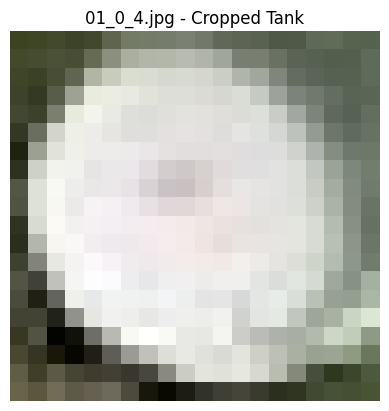

In [24]:
plt.imshow(tank_crop)
plt.title(f"{file_name} - Cropped Tank")
plt.axis("off")
plt.show()


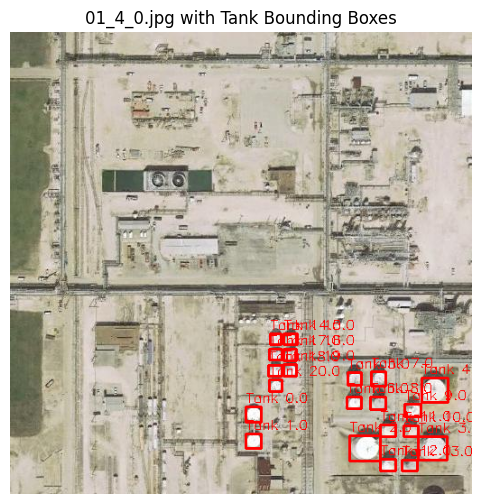

In [25]:
import cv2
import matplotlib.pyplot as plt
import pandas as pd

# Load merged CSV
df = pd.read_csv("/kaggle/working/merged_patch_annotations.csv")
tank_df = df[(df["status"] == "Tank") & (df["geometry"].notna())].copy()

# Select one patch
target_file = "01_4_0.jpg"
geometry_rows = tank_df[tank_df["file_name"] == target_file]

# Load image
img_path = f"/kaggle/input/oil-storage-tanks/Oil Tanks/image_patches/{target_file}"
img = cv2.imread(img_path)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Draw each tank's rectangle
for _, row in geometry_rows.iterrows():
    geometry = eval(row["geometry"])
    x_coords = [p["x"] for p in geometry]
    y_coords = [p["y"] for p in geometry]

    x1, y1 = min(x_coords), min(y_coords)
    x2, y2 = max(x_coords), max(y_coords)

    cv2.rectangle(img_rgb, (x1, y1), (x2, y2), (255, 0, 0), 2)
    cv2.putText(img_rgb, f'Tank {row["tank_index"]}', (x1, y1 - 5),
                cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 1)

# Show image
plt.figure(figsize=(6, 6))
plt.imshow(img_rgb)
plt.title(f"{target_file} with Tank Bounding Boxes")
plt.axis("off")
plt.show()


In [26]:
from sklearn.model_selection import train_test_split

# Load full dataframe
df = pd.read_csv("/kaggle/working/merged_patch_annotations.csv")
tank_df = df[(df["status"] == "Tank") & (df["geometry"].notna())].copy()

# Get unique image names
unique_files = tank_df["file_name"].unique()
train_files, val_files = train_test_split(unique_files, test_size=0.2, random_state=42)


In [27]:
print(len(train_files))
print(len(val_files))

272
69


In [28]:
import os

for subset in ["train", "val"]:
    os.makedirs(f"/kaggle/working/dataset/images/{subset}", exist_ok=True)
    os.makedirs(f"/kaggle/working/dataset/labels/{subset}", exist_ok=True)


In [29]:
import shutil
import ast

for subset, files in [("train", train_files), ("val", val_files)]:
    for file in files:
        # Copy image
        src_img_path = f"/kaggle/input/oil-storage-tanks/Oil Tanks/image_patches/{file}"
        dst_img_path = f"/kaggle/working/dataset/images/{subset}/{file}"
        shutil.copyfile(src_img_path, dst_img_path)
        
        # Get rows
        rows = tank_df[tank_df["file_name"] == file]
        image = cv2.imread(src_img_path)
        h, w = image.shape[:2]

        # Write label file
        label_path = f"/kaggle/working/dataset/labels/{subset}/{file.replace('.jpg', '.txt')}"
        with open(label_path, "w") as f:
            for _, row in rows.iterrows():
                geometry = ast.literal_eval(row["geometry"])
                x_coords = [p["x"] for p in geometry]
                y_coords = [p["y"] for p in geometry]
                x1, y1 = min(x_coords), min(y_coords)
                x2, y2 = max(x_coords), max(y_coords)
                
                # Convert to YOLO format
                x_center = ((x1 + x2) / 2) / w
                y_center = ((y1 + y2) / 2) / h
                bbox_w = (x2 - x1) / w
                bbox_h = (y2 - y1) / h

                f.write(f"0 {x_center:.6f} {y_center:.6f} {bbox_w:.6f} {bbox_h:.6f}\n")


In [30]:
yaml_text = """
path: /kaggle/working/dataset
train: images/train
val: images/val

nc: 1
names: ['tank']
"""

with open("/kaggle/working/dataset/data.yaml", "w") as f:
    f.write(yaml_text.strip())


In [31]:
import torch

print("CUDA available:", torch.cuda.is_available())
print("Device:", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "CPU")


CUDA available: True
Device: Tesla P100-PCIE-16GB


In [1]:
from ultralytics import YOLO
model = YOLO('yolov8n.pt')
model.train(data="/kaggle/working/dataset/data.yaml", epochs=30, imgsz=512)


Ultralytics 8.3.163 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/dataset/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=512, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train2, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pos

train: Scanning /kaggle/working/dataset/labels/train... 272 images, 0 backgrounds, 0 corrupt: 100%|██████████| 272/272 [00:00<00:00, 1366.74it/s]


train: New cache created: /kaggle/working/dataset/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 1.0±2.3 ms, read: 407.5±224.0 MB/s, size: 50.0 KB)


val: Scanning /kaggle/working/dataset/labels/val... 69 images, 0 backgrounds, 0 corrupt: 100%|██████████| 69/69 [00:00<00:00, 762.53it/s]

val: New cache created: /kaggle/working/dataset/labels/val.cache


Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 512 train, 512 val
Using 4 dataloader workers
Logging results to runs/detect/train2
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      1.87G      1.275      2.773      1.054        184        512: 100%|██████████| 17/17 [00:03<00:00,  4.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.37it/s]

                   all         69        619     0.0234      0.784      0.571      0.375



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30       1.9G      1.004      1.029     0.8967        183        512: 100%|██████████| 17/17 [00:02<00:00,  6.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.11it/s]

                   all         69        619      0.114       0.43     0.0819     0.0581



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      1.92G     0.9622     0.8845     0.8866        151        512: 100%|██████████| 17/17 [00:02<00:00,  6.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.21it/s]

                   all         69        619      0.963      0.294      0.736      0.524



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      1.93G     0.9161     0.8051     0.8857        109        512: 100%|██████████| 17/17 [00:02<00:00,  6.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.56it/s]

                   all         69        619      0.917      0.518      0.786       0.54



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      1.95G     0.9186     0.7814     0.8833        194        512: 100%|██████████| 17/17 [00:02<00:00,  6.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.30it/s]

                   all         69        619      0.971      0.437      0.837      0.594



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      1.97G      0.926     0.7686     0.8798        291        512: 100%|██████████| 17/17 [00:02<00:00,  6.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.04it/s]

                   all         69        619      0.899      0.848      0.917       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      1.98G     0.9073     0.7605     0.8781        150        512: 100%|██████████| 17/17 [00:02<00:00,  6.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.87it/s]

                   all         69        619       0.88      0.803      0.908      0.656



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30         2G     0.8944     0.7403     0.8623        195        512: 100%|██████████| 17/17 [00:02<00:00,  6.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.79it/s]

                   all         69        619      0.889      0.835      0.908      0.675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      2.02G     0.8524     0.6556     0.8665        214        512: 100%|██████████| 17/17 [00:02<00:00,  6.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.05it/s]

                   all         69        619      0.905      0.844       0.92      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      2.04G     0.8202     0.6223     0.8673        110        512: 100%|██████████| 17/17 [00:02<00:00,  6.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.81it/s]

                   all         69        619      0.911      0.868       0.93      0.693



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      2.05G     0.8376     0.6177     0.8648        240        512: 100%|██████████| 17/17 [00:02<00:00,  6.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.37it/s]

                   all         69        619      0.938      0.827      0.928      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      2.07G     0.7981     0.6081     0.8589        180        512: 100%|██████████| 17/17 [00:02<00:00,  6.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.35it/s]

                   all         69        619      0.908      0.866      0.932      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      2.09G      0.779     0.5817     0.8526        204        512: 100%|██████████| 17/17 [00:02<00:00,  6.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.33it/s]

                   all         69        619      0.904      0.869      0.934      0.703



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30       2.1G     0.7899     0.5643     0.8493        282        512: 100%|██████████| 17/17 [00:02<00:00,  6.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.59it/s]

                   all         69        619      0.932       0.85      0.933      0.699



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      2.12G     0.7991     0.5625     0.8542        223        512: 100%|██████████| 17/17 [00:02<00:00,  6.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.00it/s]

                   all         69        619      0.951      0.866      0.944      0.696



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      2.14G     0.7615     0.5527     0.8531        162        512: 100%|██████████| 17/17 [00:02<00:00,  6.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.63it/s]

                   all         69        619      0.931      0.877      0.943      0.723



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      2.15G     0.7607     0.5344     0.8529        284        512: 100%|██████████| 17/17 [00:02<00:00,  7.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.15it/s]

                   all         69        619      0.919      0.887      0.947      0.723



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      2.17G     0.7906     0.5432     0.8488        184        512: 100%|██████████| 17/17 [00:02<00:00,  6.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.44it/s]

                   all         69        619      0.901      0.885      0.938      0.717



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      2.19G     0.7761     0.5286      0.849        176        512: 100%|██████████| 17/17 [00:02<00:00,  6.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.54it/s]

                   all         69        619       0.89      0.865      0.923      0.709



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      2.21G      0.743     0.5107     0.8431        159        512: 100%|██████████| 17/17 [00:02<00:00,  6.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.70it/s]

                   all         69        619      0.879      0.868      0.924      0.709


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      2.22G     0.7589     0.5477     0.8485         61        512: 100%|██████████| 17/17 [00:03<00:00,  5.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.70it/s]

                   all         69        619      0.917      0.847      0.923      0.699



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      2.24G     0.7258     0.5256     0.8396        107        512: 100%|██████████| 17/17 [00:02<00:00,  7.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.32it/s]

                   all         69        619      0.893      0.876      0.937      0.714



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      2.26G     0.7464     0.5256     0.8393        143        512: 100%|██████████| 17/17 [00:02<00:00,  6.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.16it/s]

                   all         69        619      0.911      0.861      0.931      0.703



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      2.27G     0.7629      0.523     0.8557         89        512: 100%|██████████| 17/17 [00:02<00:00,  6.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.74it/s]

                   all         69        619       0.93      0.859      0.938      0.713



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      2.29G     0.7274     0.5029      0.847        135        512: 100%|██████████| 17/17 [00:02<00:00,  7.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.66it/s]

                   all         69        619        0.9      0.885      0.933      0.708



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      2.31G      0.722     0.4774     0.8279        140        512: 100%|██████████| 17/17 [00:02<00:00,  7.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.47it/s]

                   all         69        619      0.905      0.887      0.934       0.71



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      2.33G     0.7208     0.4902     0.8373         66        512: 100%|██████████| 17/17 [00:02<00:00,  6.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.38it/s]

                   all         69        619      0.887       0.88      0.927      0.701



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      2.34G     0.7039     0.4742     0.8329         95        512: 100%|██████████| 17/17 [00:02<00:00,  6.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.50it/s]

                   all         69        619      0.931      0.858      0.939      0.724



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      2.36G     0.7008      0.461     0.8386         96        512: 100%|██████████| 17/17 [00:02<00:00,  6.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.81it/s]

                   all         69        619      0.938      0.868      0.945       0.72



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      2.38G     0.6879     0.4548     0.8344        162        512: 100%|██████████| 17/17 [00:02<00:00,  6.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.66it/s]

                   all         69        619      0.948      0.861      0.946      0.721



30 epochs completed in 0.027 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 6.2MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics 8.3.163 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.49it/s]
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all         69        619      0.929      0.858      0.939      0.724
Speed: 0.1ms preprocess, 1.7ms inference, 0.0ms loss, 1.9ms postprocess per image
Results saved to runs/detect/train2


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x785db176d050>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

In [4]:
from ultralytics import YOLO
model = YOLO("runs/detect/train2/weights/best.pt")



image 1/1 /kaggle/input/oil-storage-tanks/Oil Tanks/image_patches/01_4_0.jpg: 512x512 21 tanks, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 512, 512)


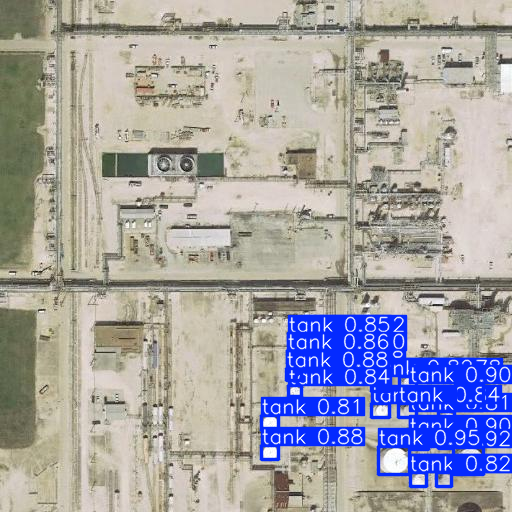

In [6]:
results = model.predict("/kaggle/input/oil-storage-tanks/Oil Tanks/image_patches/01_4_0.jpg", conf=0.4)
results[0].show()



image 1/1 /kaggle/input/oil-storage-tanks/Oil Tanks/image_patches/01_4_0.jpg: 512x512 21 tanks, 5.7ms
Speed: 1.0ms preprocess, 5.7ms inference, 1.4ms postprocess per image at shape (1, 3, 512, 512)


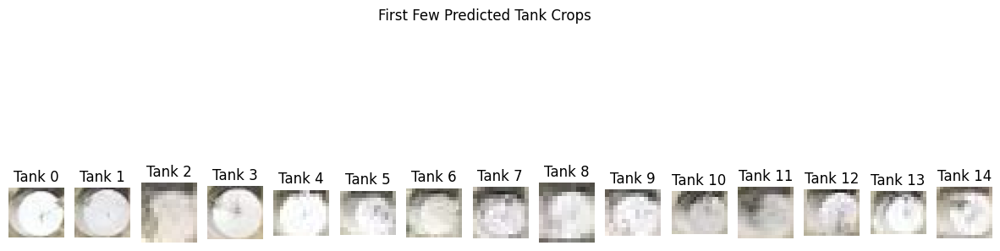

In [11]:
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt

# Load model and image
model = YOLO("runs/detect/train2/weights/best.pt")
img_path = "/kaggle/input/oil-storage-tanks/Oil Tanks/image_patches/01_4_0.jpg"
results = model.predict(img_path, conf=0.4)

# Load image as RGB
img = cv2.imread(img_path)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Extract boxes
boxes = results[0].boxes.xyxy.cpu().numpy().astype(int)

# Crop and collect
tank_crops = [img_rgb[y1:y2, x1:x2] for x1, y1, x2, y2 in boxes]

# Plot first 5 crops
n = min(15, len(tank_crops))
fig, axs = plt.subplots(1, n, figsize=(15, 5))

for i in range(n):
    axs[i].imshow(tank_crops[i])
    axs[i].set_title(f"Tank {i}")
    axs[i].axis("off")

plt.suptitle("First Few Predicted Tank Crops")
plt.show()


In [12]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt

# Load full large image
large_img_path = "/kaggle/input/oil-storage-tanks/Oil Tanks/large_images/04_large.jpg"
large_img = cv2.imread(large_img_path)
large_img_rgb = cv2.cvtColor(large_img, cv2.COLOR_BGR2RGB)
H, W = large_img_rgb.shape[:2]
print("Loaded image size:", W, "x", H)

# Tile params
tile_size = 512
stride = 384  # 25% overlap (optional)

tiles = []
positions = []

for y in range(0, H - tile_size + 1, stride):
    for x in range(0, W - tile_size + 1, stride):
        crop = large_img_rgb[y:y+tile_size, x:x+tile_size]
        tiles.append(crop)
        positions.append((x, y))

print(f"Tiled into {len(tiles)} patches.")


Loaded image size: 4800 x 4800
Tiled into 144 patches.


In [17]:
from ultralytics import YOLO

# Load trained model
model = YOLO("runs/detect/train2/weights/best.pt")

# Store global boxes and crops
global_boxes = []
global_crops = []

for idx, (tile, (x_offset, y_offset)) in enumerate(zip(tiles, positions)):
    # Save tile temporarily
    tile_path = f"/kaggle/working/tile_{idx}.jpg"
    cv2.imwrite(tile_path, cv2.cvtColor(tile, cv2.COLOR_RGB2BGR))

    # Predict on tile
    results = model.predict(tile_path, imgsz=512, conf=0.4, verbose=False)
    boxes = results[0].boxes.xyxy.cpu().numpy().astype(int)

    # Convert to global coordinates and store
    for box in boxes:
        x1, y1, x2, y2 = box
        gx1 = x1 + x_offset
        gy1 = y1 + y_offset
        gx2 = x2 + x_offset
        gy2 = y2 + y_offset

        global_boxes.append((gx1, gy1, gx2, gy2))
        crop = large_img_rgb[gy1:gy2, gx1:gx2]
        global_crops.append(crop)

print(f"✅ Detected {len(global_boxes)} tanks in full image.")


✅ Detected 437 tanks in full image.


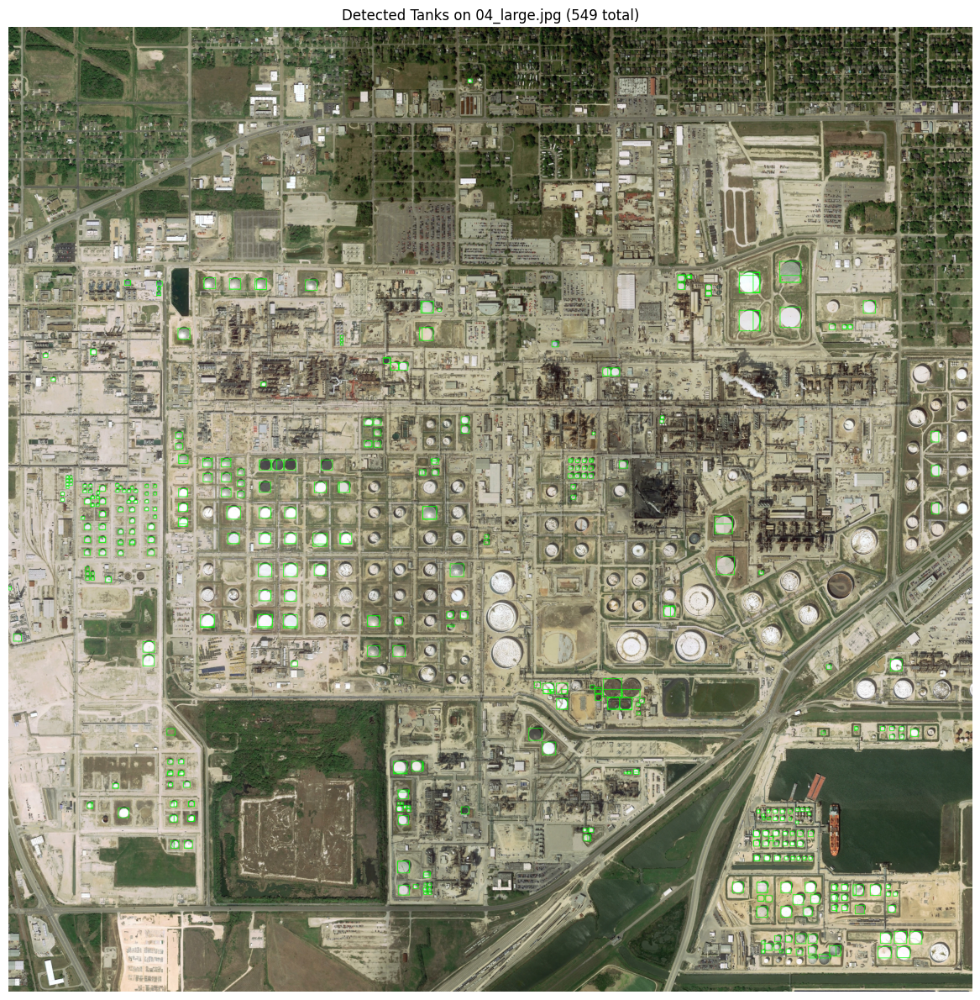

In [23]:
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Load trained model
model = YOLO("runs/detect/train2/weights/best.pt")

# Load large image
large_img_path = "/kaggle/input/oil-storage-tanks/Oil Tanks/large_images/01_large.jpg"
large_img = cv2.imread(large_img_path)
large_img_rgb = cv2.cvtColor(large_img, cv2.COLOR_BGR2RGB)
H, W = large_img_rgb.shape[:2]

# Tiling
tile_size = 512
stride = 412

tiles = []
positions = []

for y in range(0, H - tile_size + 1, stride):
    for x in range(0, W - tile_size + 1, stride):
        crop = large_img_rgb[y:y+tile_size, x:x+tile_size]
        tiles.append(crop)
        positions.append((x, y))

# Run YOLO and collect global boxes
global_boxes = []

for idx, (tile, (x_offset, y_offset)) in enumerate(zip(tiles, positions)):
    # Convert tile to BGR for YOLO
    tile_bgr = cv2.cvtColor(tile, cv2.COLOR_RGB2BGR)

    # In-memory inference
    results = model.predict(source=tile_bgr, imgsz=512, conf=0.4, verbose=False)

    boxes = results[0].boxes.xyxy.cpu().numpy().astype(int)

    for box in boxes:
        x1, y1, x2, y2 = box
        gx1 = x1 + x_offset
        gy1 = y1 + y_offset
        gx2 = x2 + x_offset
        gy2 = y2 + y_offset
        global_boxes.append((gx1, gy1, gx2, gy2))

# Draw global boxes on full image
full_img_with_boxes = large_img_rgb.copy()
for (x1, y1, x2, y2) in global_boxes:
    cv2.rectangle(full_img_with_boxes, (x1, y1), (x2, y2), (0, 255, 0), 2)

# Show final image
plt.figure(figsize=(12, 12))
plt.imshow(full_img_with_boxes)
plt.title(f"Detected Tanks on 04_large.jpg ({len(global_boxes)} total)")
plt.axis("off")
plt.tight_layout()
plt.show()


In [24]:
import numpy as np

def iou(boxA, boxB):
    xa1, ya1, xa2, ya2 = boxA
    xb1, yb1, xb2, yb2 = boxB

    # Intersection
    xi1 = max(xa1, xb1)
    yi1 = max(ya1, yb1)
    xi2 = min(xa2, xb2)
    yi2 = min(ya2, yb2)
    inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)

    # Union
    boxA_area = (xa2 - xa1) * (ya2 - ya1)
    boxB_area = (xb2 - xb1) * (yb2 - yb1)
    union_area = boxA_area + boxB_area - inter_area

    return inter_area / union_area if union_area > 0 else 0

def merge_boxes(boxes, iou_thresh=0.5):
    boxes = boxes.copy()
    merged = []
    while boxes:
        base = boxes.pop(0)
        to_merge = [base]

        rest = []
        for b in boxes:
            if iou(base, b) > iou_thresh:
                to_merge.append(b)
            else:
                rest.append(b)

        # Merge group
        merged_box = (
            min([b[0] for b in to_merge]),
            min([b[1] for b in to_merge]),
            max([b[2] for b in to_merge]),
            max([b[3] for b in to_merge])
        )
        merged.append(merged_box)
        boxes = rest

    return merged


🧹 Merged from 549 → 370 boxes


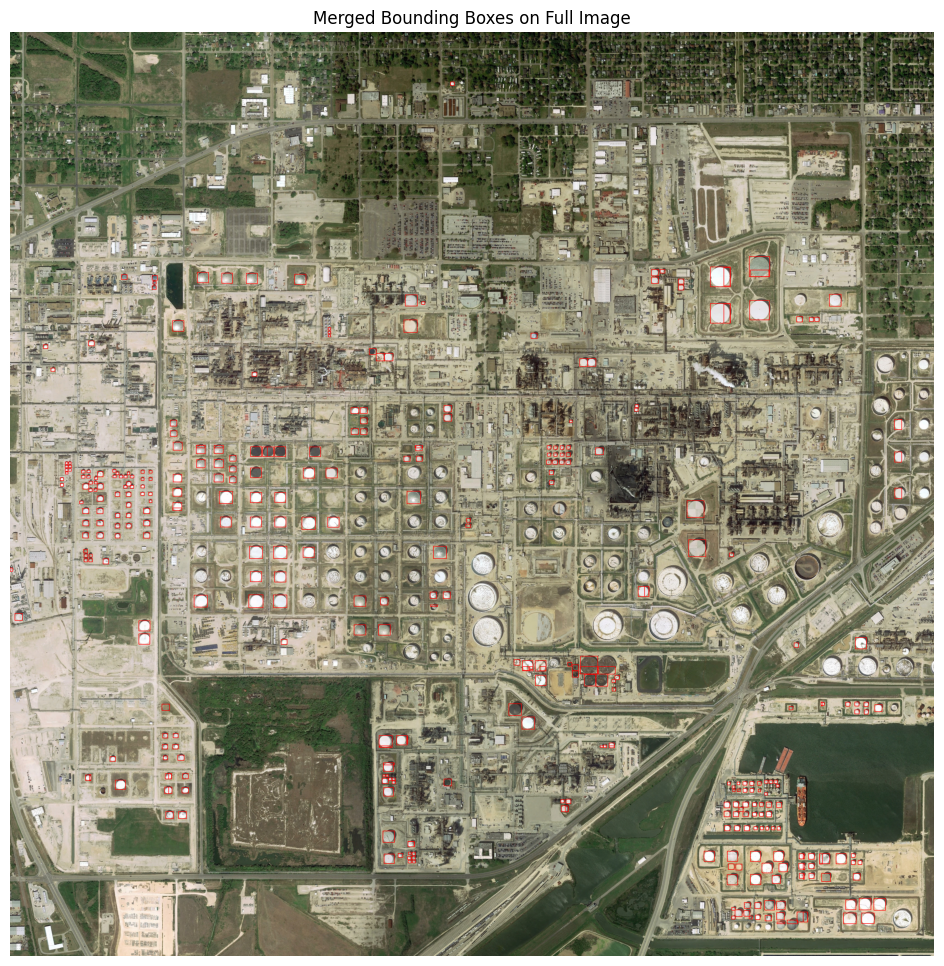

In [25]:
# Run merge
merged_boxes = merge_boxes(global_boxes, iou_thresh=0.5)
print(f"🧹 Merged from {len(global_boxes)} → {len(merged_boxes)} boxes")

# Draw on image
merged_img = large_img_rgb.copy()
for (x1, y1, x2, y2) in merged_boxes:
    cv2.rectangle(merged_img, (x1, y1), (x2, y2), (255, 0, 0), 2)

# Show result
plt.figure(figsize=(12, 12))
plt.imshow(merged_img)
plt.title("Merged Bounding Boxes on Full Image")
plt.axis("off")
plt.show()


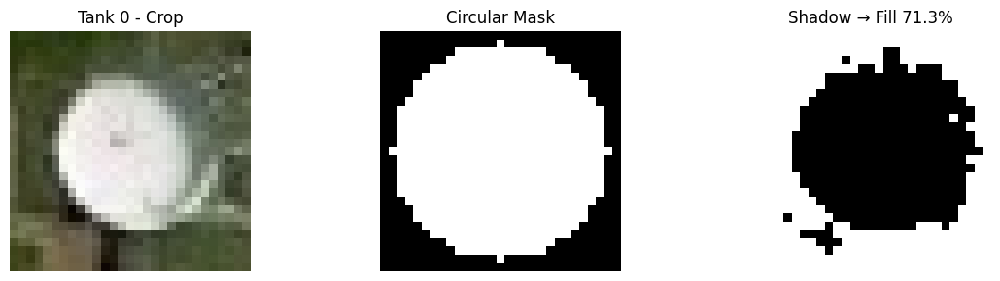

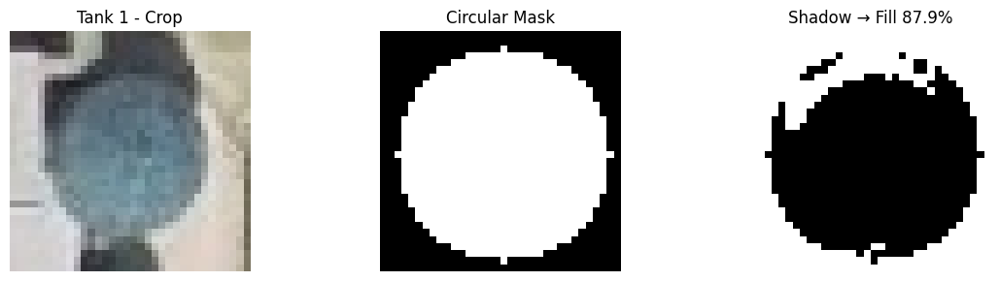

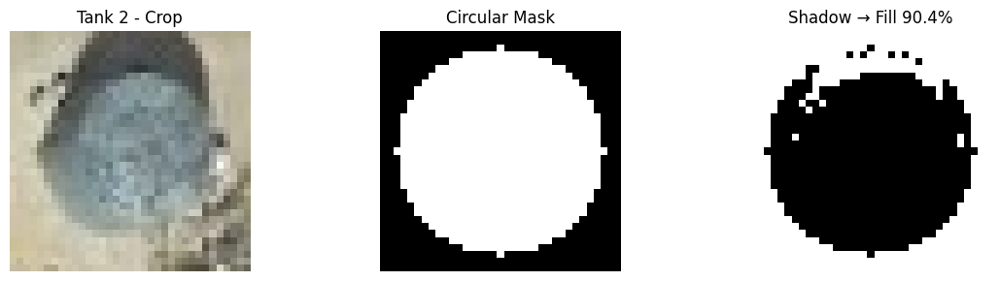

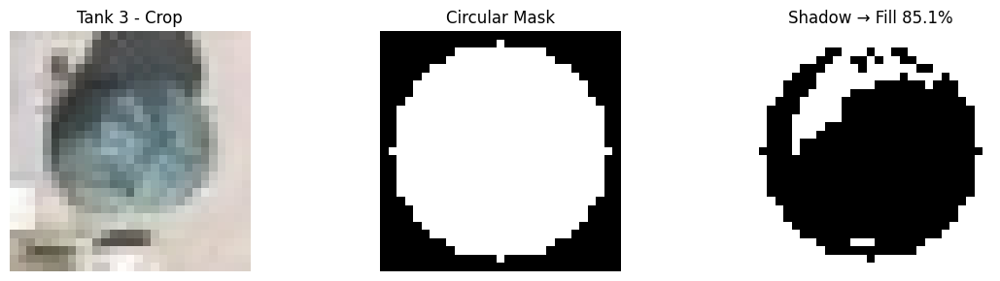

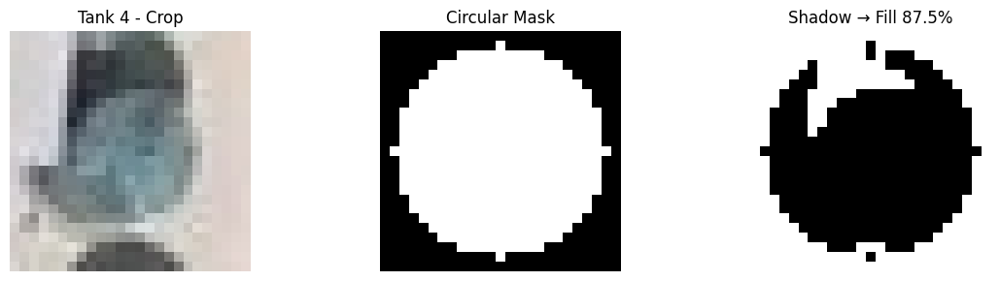

...

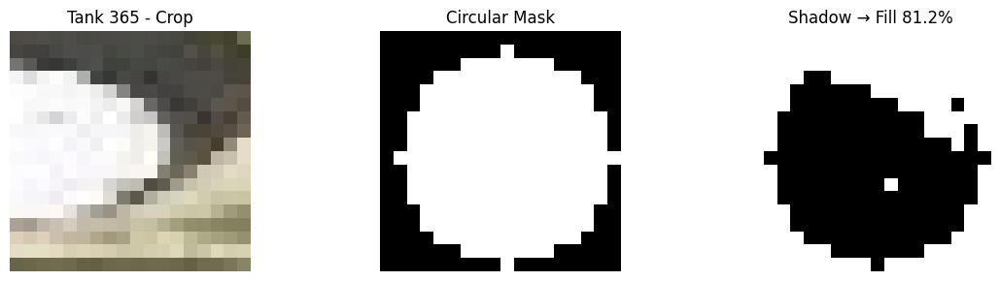

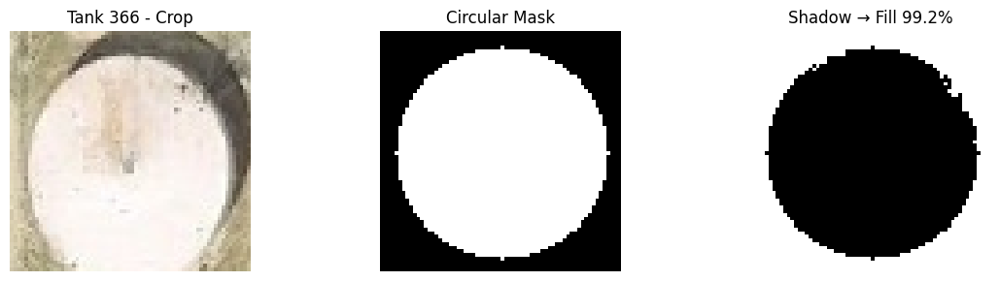

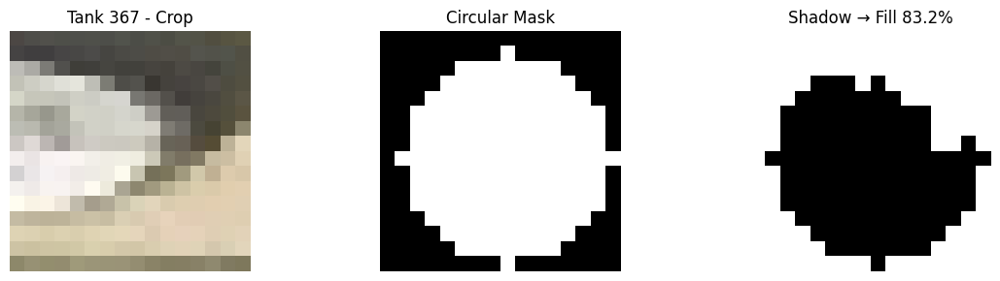

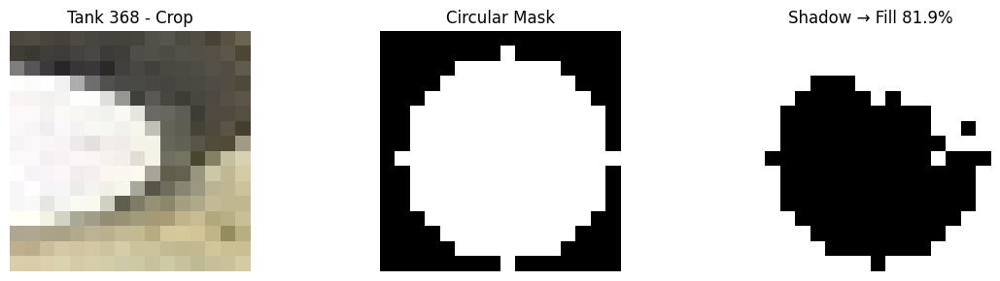

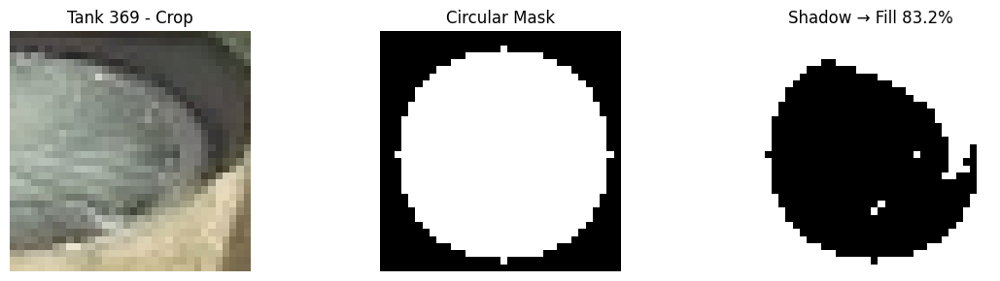

✅ Saved fill estimates CSV.


In [26]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Function: Circular crop + shadow % estimation + visualization
def estimate_fill_from_tank_crop(crop, tank_id=None):
    h, w = crop.shape[:2]
    size = min(h, w)

    # Resize to square for circle fitting
    crop_resized = cv2.resize(crop, (size, size), interpolation=cv2.INTER_CUBIC)

    # Convert to grayscale
    gray = cv2.cvtColor(crop_resized, cv2.COLOR_RGB2GRAY)

    # Circular mask
    mask = np.zeros((size, size), dtype=np.uint8)
    center = (size // 2, size // 2)
    radius = int(size * 0.45)
    cv2.circle(mask, center, radius, 255, -1)

    # Apply mask
    gray_masked = cv2.bitwise_and(gray, gray, mask=mask)

    # Shadow detection
    _, shadow_mask = cv2.threshold(gray_masked, 80, 255, cv2.THRESH_BINARY_INV)

    # Calculate shadow %
    shadow_pixels = np.sum((shadow_mask > 0) & (mask > 0))
    total_pixels = np.sum(mask > 0)
    shadow_pct = (shadow_pixels / total_pixels) * 100
    fill_pct = 100 - shadow_pct

    # Visualization
    plt.figure(figsize=(12, 3))
    plt.subplot(1, 3, 1)
    plt.imshow(crop_resized)
    plt.title(f"Tank {tank_id} - Crop")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(mask, cmap="gray")
    plt.title("Circular Mask")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(shadow_mask, cmap="gray")
    plt.title(f"Shadow → Fill {fill_pct:.1f}%")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

    return round(fill_pct, 2)

# --- Process all merged tanks ---
results = []

for i, (x1, y1, x2, y2) in enumerate(merged_boxes):
    # Add padding
    pad = 5
    x1 = max(x1 - pad, 0)
    y1 = max(y1 - pad, 0)
    x2 = min(x2 + pad, large_img_rgb.shape[1])
    y2 = min(y2 + pad, large_img_rgb.shape[0])

    # Crop from full-resolution image
    crop = large_img_rgb[y1:y2, x1:x2]

    try:
        fill = estimate_fill_from_tank_crop(crop, tank_id=i)
    except Exception as e:
        print(f"⚠️ Tank {i} failed: {e}")
        fill = None

    results.append({
        "tank_id": i,
        "x1": x1, "y1": y1, "x2": x2, "y2": y2,
        "fill_percent": fill
    })

# Save output
df_fill = pd.DataFrame(results)
df_fill.to_csv("/kaggle/working/fill_estimates.csv", index=False)

print("✅ Saved fill estimates CSV.")


In [27]:
!cd /kaggle/working && zip -r fill_level_project.zip .


  adding: tile_52.jpg (deflated 1%)
  adding: yolov8n.pt (deflated 9%)
  adding: tile_70.jpg (deflated 1%)
  adding: tile_89.jpg (deflated 1%)
  adding: tile_118.jpg (deflated 1%)
  adding: tile_33.jpg (deflated 1%)
  adding: tile_36.jpg (deflated 1%)
  adding: tile_122.jpg (deflated 1%)
  adding: tile_108.jpg (deflated 1%)
  adding: tile_113.jpg (deflated 1%)
  adding: tile_24.jpg (deflated 1%)
  adding: fill_estimates.csv (deflated 55%)
  adding: tile_32.jpg (deflated 1%)
  adding: tile_54.jpg (deflated 1%)
  adding: dataset/ (stored 0%)
  adding: dataset/images/ (stored 0%)
  adding: dataset/images/val/ (stored 0%)
  adding: dataset/images/val/02_2_4.jpg (deflated 0%)
  adding: dataset/images/val/04_7_0.jpg (deflated 0%)
  adding: dataset/images/val/06_5_5.jpg (deflated 0%)
  adding: dataset/images/val/04_6_6.jpg (deflated 0%)
  adding: dataset/images/val/03_3_6.jpg (deflated 0%)
  adding: dataset/images/val/02_2_7.jpg (deflated 0%)
  adding: dataset/images/val/01_6_6.jpg (deflated 